# Midi visualzation
In this notebook, we extract main melody from audio representation of music and experiment with spectrogram and visualization of other styles inspired by Superatism.

## 1. Extract note events from midi file

We can first use pretty_midi module to synthesize the midi events to sound waves and the ipython module to display the audio.

In [73]:
midi_file_name = "../../FMP_1/data/C4/FMP_C4_F05_Sibelius_Piano.mid"


In [74]:
import pretty_midi
import IPython.display as ipd

Fs = 22050
midi_data = pretty_midi.PrettyMIDI(midi_file_name)
audio_data = midi_data.synthesize(fs=Fs)
ipd.Audio(audio_data, rate=Fs)

To extract the note events from the midi file, we use mido objects. 

We can first explore the track information in the file and see what the first 20 midi messages look like. Notice if there are all note_on events, it's because some note_on events have 0 velocity. That is equivalent to note_off event.

In [75]:
import mido

mid = mido.MidiFile(midi_file_name, clip=True)
mid.tracks

[<midi track '' 7 messages>, <midi track '' 1111 messages>]

In [76]:
for m in mid.tracks[1][:20]:
    print(m)

program_change channel=0 program=1 time=0
control_change channel=0 control=121 value=0 time=0
control_change channel=0 control=64 value=0 time=0
control_change channel=0 control=91 value=48 time=0
control_change channel=0 control=10 value=64 time=0
control_change channel=0 control=7 value=100 time=0
note_on channel=0 note=62 velocity=98 time=0
note_on channel=0 note=67 velocity=104 time=1440
note_off channel=0 note=62 velocity=0 time=26
note_off channel=0 note=67 velocity=0 time=428
note_on channel=0 note=70 velocity=105 time=26
note_on channel=0 note=67 velocity=101 time=1440
note_off channel=0 note=70 velocity=0 time=26
note_off channel=0 note=67 velocity=0 time=428
note_on channel=0 note=66 velocity=97 time=26
note_on channel=0 note=67 velocity=98 time=1440
note_off channel=0 note=66 velocity=0 time=26
note_on channel=0 note=69 velocity=101 time=214
note_off channel=0 note=67 velocity=0 time=4
note_off channel=0 note=69 velocity=0 time=221


Here we collect information about each note (start_time, end_time, pitch, velocity) from note_on and note_off event and store them in a dataframe. Also, we convert the time unit from ticks to seconds.

In [77]:
import pandas as pd

note_arr = []
time = 0
temp = {}

for m in mid.tracks[1]:
    time += m.time
    
    if m.type == "note_on" and m.velocity > 0:
        note = {"note":m.note, "time":[time,-1], "velocity":m.velocity}
        note = [time, -1, m.note, m.velocity]
        temp[m.note] = note
        
    elif m.type == "note_off" or (m.type == "note_on" and m.velocity == 0):
        note = temp[m.note]
        note[1] = time
        note_arr.append(note)

df = pd.DataFrame(note_arr, columns=['Start', 'End', 'Pitch', 'Velocity'])

# convert from time units from ticks to seconds
tempo = 500000 # default tempo = 500000 ms/beat
ticks_per_beat = mid.ticks_per_beat
df["Start"] = tempo * df["Start"] / ticks_per_beat / 1000000
df["End"] = tempo * df["End"] / ticks_per_beat / 1000000

df

,Start,End,Pitch,Velocity
0,0.00,0.763542,62,98
1,0.75,0.986458,67,104
2,1.00,1.763542,70,105
3,1.75,1.986458,67,101
4,2.00,2.763542,66,97
...,...,...,...,...
547,140.50,140.750000,78,111
548,141.00,141.500000,55,114
549,141.00,141.500000,62,114
550,141.00,141.500000,70,114


## 2. Convert note events to color and shape

To visualize our notes, we need to convert the note events to the color of the rectangle in HSL values and the coordinates of rectangles on the canvas.

Here's how we map our note value to hsl value for visualization.
* pitch_class (1-12) => hue (0-359)
* octave (0-8) => lightness (20-80)
* velocity (40-127) => saturation (0-100)

In [36]:
def note_to_hsl(note):
    pitch = note[2]
    velocity = note[3]
    
    octave = pitch // 12 - 1
    pitch_class = pitch % 12
    
    hue = int(pitch_class * 30)
    lightness = int(octave / 8 * 60 + 20)
    saturation = int((velocity-20) / 67 * 100)
    
    hsl = (hue,saturation,lightness)
    
    return hsl

note = list(df.iloc[0])
hsl = note_to_hsl(note)
print(hsl)

(60, 116, 50)


We map the note event to the coordinates of rectangle according to time.

In [61]:
def note_to_coor(note, canvas):
    w = canvas[0]
    note_w = 20
    unit_h = 25
    
    x0 = (note[0] % note_w) / note_w * w
    x1 = (note[1] % note_w) / note_w * w
    y0 = note[0] // note_w * unit_h * 2
    y1 = y0 + unit_h
    
    if x0 > x1:
        x1 = w
    coor = [x0,y0,x1,y1]
    
    return coor

We can also implement a helper function to convert from midi pitch number to note name (ex. from 60 to C4).

In [58]:
def pitch_to_name(pitch):
    octave = pitch // 12 - 1
    pitch_class = pitch % 12
    
    pitch_classes = ["C","C#","D","D#","E","F","F#","G","G#","A","A#","B"]
    name = str(pitch_classes[pitch_class]) + str(octave)
    
    return name

print(pitch_to_name(62))

D4


## 3. Display visualization

To test how good the color we picked for each note pitch, we can visualize a test note dataframe of chromatic scale from A0 to C8.

[(270, 119, 20), (300, 119, 20), (330, 119, 20), (0, 119, 27), (30, 119, 27), (60, 119, 27), (90, 119, 27), (120, 119, 27), (150, 119, 27), (180, 119, 27), (210, 119, 27), (240, 119, 27), (270, 119, 27), (300, 119, 27), (330, 119, 27), (0, 119, 35), (30, 119, 35), (60, 119, 35), (90, 119, 35), (120, 119, 35), (150, 119, 35), (180, 119, 35), (210, 119, 35), (240, 119, 35), (270, 119, 35), (300, 119, 35), (330, 119, 35), (0, 119, 42), (30, 119, 42), (60, 119, 42), (90, 119, 42), (120, 119, 42), (150, 119, 42), (180, 119, 42), (210, 119, 42), (240, 119, 42), (270, 119, 42), (300, 119, 42), (330, 119, 42), (0, 119, 50), (30, 119, 50), (60, 119, 50), (90, 119, 50), (120, 119, 50), (150, 119, 50), (180, 119, 50), (210, 119, 50), (240, 119, 50), (270, 119, 50), (300, 119, 50)]


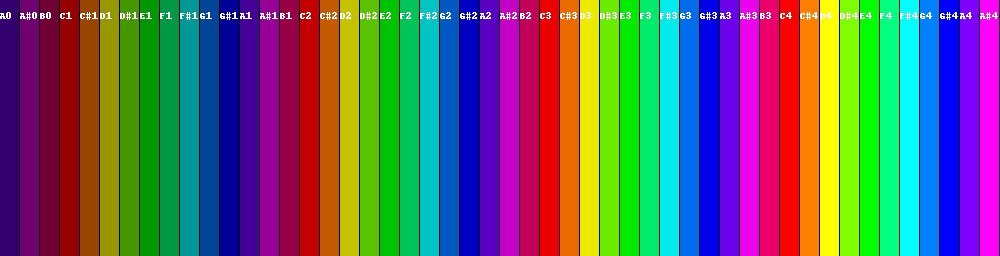

In [27]:
from PIL import Image, ImageDraw
from IPython.display import display

# A test note dataframe as chromatic scale from A0 to C8
note_df = pd.DataFrame(columns=['Start', 'End', 'Pitch', 'Velocity'])
note_df["Pitch"] = range(21,71)
note_df["Velocity"] = 100

hsl_ls = [note_to_hsl(list(note_df.iloc[i])) for i in range(len(note_df))]
print(hsl_ls)
w, h = 1000, 256
img = Image.new("RGB", (w, h)) 
x0, y0, x1, y1 = 0, 0, 18, 256

for i in range(len(hsl_ls)):
    img1 = ImageDraw.Draw(img)
    coor = [(x0, y0), (x1, y1)]
    
    color = "hsl({},{}%,{}%)".format(hsl_ls[i][0],hsl_ls[i][1],hsl_ls[i][2])
    img1.rectangle(coor, fill = color)
    
    note_num = note_df["Pitch"].iloc[i]
    note_name = pitch_to_name(note_num)
    
    img1.text((x0,y0+10),note_name,fill="white")
    
    x0 = x0 + 20
    x1 = x1 + 20

display(img)

Now we can visualize the actual music.

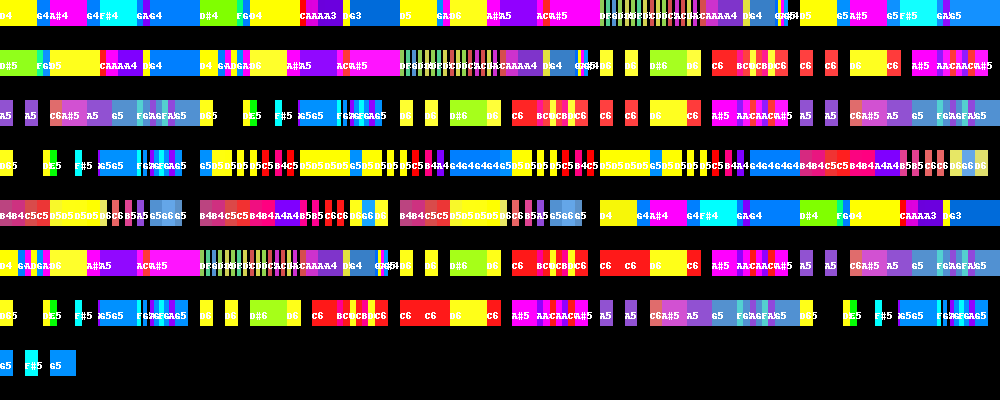

In [78]:
hsl_ls = [note_to_hsl(list(df.iloc[i])) for i in range(len(df))]

w, h = 1000, 400
img = Image.new("RGB", (w, h)) 
x0, y0, x1, y1 = 0, 0, 50, 25

for i in range(len(df)):
    x0, y0, x1, y1 = note_to_coor(df.iloc[i],[w,h])
    
    img1 = ImageDraw.Draw(img)
    coor = [(x0, y0), (x1, y1)]
    
    color = "hsl({},{}%,{}%)".format(hsl_ls[i][0],hsl_ls[i][1],hsl_ls[i][2])
    img1.rectangle(coor, fill = color)
    
    note_num = df["Pitch"].iloc[i]
    note_name = pitch_to_name(note_num)
    
    img1.text((x0,y0+10),note_name,fill="white")
    
display(img)

## 4. Overlapping commands

In [79]:
midi_file_name2 = "../../../ML/data_set/maestro-v3.0.0/2004/MIDI-Unprocessed_SMF_22_R1_2004_01-04_ORIG_MID--AUDIO_22_R1_2004_05_Track05_wav.midi"

Fs = 22050
midi_data = pretty_midi.PrettyMIDI(midi_file_name2)
audio_data = midi_data.synthesize(fs=Fs)
ipd.Audio(audio_data, rate=Fs)

In [93]:
note_arr = []
time = 0
temp = {}

mid = mido.MidiFile(midi_file_name2, clip=True)

for m in mid.tracks[1]:
    time += m.time
    
    if m.type == "note_on" and m.velocity > 0:
        note = {"note":m.note, "time":[time,-1], "velocity":m.velocity}
        note = [time, -1, m.note, m.velocity]
        temp[m.note] = note
        
    elif m.type == "note_off" or (m.type == "note_on" and m.velocity == 0):
        note = temp[m.note]
        note[1] = time
        note_arr.append(note)

df = pd.DataFrame(note_arr, columns=['Start', 'End', 'Pitch', 'Velocity'])

# convert from time units from ticks to seconds
tempo = 500000 # default tempo = 500000 ms/beat
ticks_per_beat = mid.ticks_per_beat
df["Start"] = tempo * df["Start"] / ticks_per_beat / 1000000
df["End"] = tempo * df["End"] / ticks_per_beat / 1000000

df

,Start,End,Pitch,Velocity
0,0.091667,0.123958,74,49
1,0.204167,0.245833,79,73
2,0.337500,0.378125,83,58
3,0.455208,0.491667,78,62
4,0.580208,0.633333,79,69
...,...,...,...,...
1618,128.631250,130.526042,59,87
1619,128.443750,130.548958,62,90
1620,128.268750,130.550000,67,89
1621,128.925000,130.562500,55,90


In [86]:
start_pt = 0
end_pt = 0
overlap = {}

for i in range(len(df)):
    if start_pt < end_pt:
        overlap[[start_pt,min(end_pt)]] = df["Pitch"].iloc[i]
        start_pt = df.iloc[i]

,Start,End,Pitch,Velocity,Length
624,49.751042,52.266667,79,80,2.515625
147,10.942708,13.448958,79,81,2.506250
1622,128.259375,130.581250,43,84,2.321875
1620,128.268750,130.550000,67,89,2.281250
777,61.834375,63.950000,74,89,2.115625
...,...,...,...,...,...
46,5.659375,5.681250,81,71,0.021875
36,4.876042,4.897917,81,60,0.021875
607,50.859375,50.879167,67,59,0.019792
49,5.953125,5.971875,81,67,0.018750


In [92]:
df[df["Start"]>10.942][:20]
# df.iloc[147]

,Start,End,Pitch,Velocity
116,10.947917,10.978125,67,74
117,10.942708,10.984375,74,71
118,11.078125,11.119792,71,68
119,11.220833,11.256250,62,74
120,11.213542,11.256250,71,72
121,11.351042,11.387500,64,77
122,11.348958,11.393750,67,73
123,11.479167,11.510417,60,80
124,11.482292,11.527083,72,64
125,11.609375,11.643750,55,69


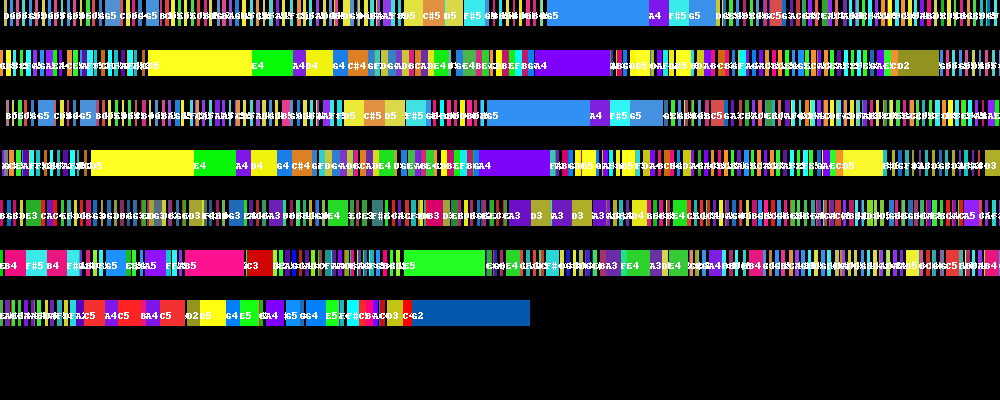

In [82]:
hsl_ls = [note_to_hsl(list(df.iloc[i])) for i in range(len(df))]

w, h = 1000, 400
img = Image.new("RGB", (w, h)) 
x0, y0, x1, y1 = 0, 0, 50, 25

for i in range(len(df)):
    x0, y0, x1, y1 = note_to_coor(df.iloc[i],[w,h])
    
    img1 = ImageDraw.Draw(img)
    coor = [(x0, y0), (x1, y1)]
    
    color = "hsl({},{}%,{}%)".format(hsl_ls[i][0],hsl_ls[i][1],hsl_ls[i][2])
    img1.rectangle(coor, fill = color)
    
    note_num = df["Pitch"].iloc[i]
    note_name = pitch_to_name(note_num)
    
    img1.text((x0,y0+10),note_name,fill="white")
    
display(img)